# CQF Exam 2
Alec Rochat
## Index
1. Index
2. Introduction
3. Code Implementation
4. Price with given parameters
5. Price convergence and errors
6. Conclusion
7. References


## Initial setup

In [135]:
# Importing libraries

import pandas as pd
# Set max row to 30
pd.set_option('display.max_rows', 30)
# round to two decimal places in python pandas
pd.options.display.float_format = '{:.4f}'.format

from numpy import *
from scipy.stats import norm

# Libraries for plotting
import matplotlib.pyplot as plt
import cufflinks as cf
cf.set_config_file(offline=True)
import plotly.graph_objects as go

from tabulate import tabulate

# Introduction
Our aim in this notebook is to implement an iterative method to price a european cash or nothing binary call stock option, explain the rationale behind this method, and describe the behaviour of pricing error relative to the number of iterations

## Brief reminder of the rationale for Monte Carlo Simulation  
The problem with option pricing is that depending on the specifications of the contract, there is no closed form analytical solution to the differential equation describing the process that drives the price of said option.  
The solution is to simulate the underlying price with a relevant model, obtain a matrix containing a large number of discrete time paths, and apply the payoff forumla of the contract to these paths at the relevant time points.  
This system is ideal because once underlying prices are simulated, we can easily adapt the payoff forumla to be applied on the path matrix and obtain prices for different contracts in an ad hoc manner.  
The main drawback is that it requires simulating a large number of paths to achieve a statistically sound price, and in case many assets, adding simulations increases computing time required in a linear fashion.  

As we are using the risk neutral framework, our stock price returns for each time increment are niid, and we can use brownian motion to generate our distribution of stock prices at each time increment.

How do we obtian a discrete version of the brownian motion?

## Euler-Maruyama method
The euler Maruyama method gives a discrete iterative calculation framework for stochastic differential equations, at the cost of precision: the solution is an approximation, and converges to the correct solution, as described below.
In the case of a stock price, the SDE describing the stock price under the risk neutral measure is 
> $ d(log(S)) = (r- \frac{1}2 {\sigma}^2 )dt + {\sigma}dX  $

Where $T$ is the maturity, $t$ is an arbitrarily small time increment, $S$ is the stock price, $r$ is the risk free rate, $\sigma$ is the volatility, $ X $ is Brownian motion

Integrating gives
> $ S_{t} = S_{0}exp{(r- \frac{1}2 {\sigma}^2 )t + {\sigma}  \int_{0}^{t} dX   } $

In the case of Brownian motion, we can directly get the price distribution at T (the terminal distribution):  
> $ S_{T} = S_{0}exp{(r- \frac{1}2 {\sigma}^2 )T + {\sigma}\sqrt{T}\phi} $

Where $ \phi $ is a standard normal random variable

## Python implementation of MCS
We define  ` simulate_path(...) `to create an array of stock price paths.
Risk Neutral measure enables us to use Geometric Brownian motion to generate our stock prices.
We use the discrete increment of a Geometric Brownian motion defined as follows:

> $ S_{t} = S_{t-{\Delta}t} exp{ ((r-\frac{1}2{\sigma}^2){\Delta}{t} +{\sigma}{\sqrt{\Delta{t}}}*z_{t}) } $  

${\Delta}t$ is the discrete time increment, $z_{t} \sim N(0,1)$

To generate a new distribution of prices for each time step based on the prices of the previous time steps and the parameters derived from the historical data.  
` n_sims ` Moderates the number of discrete observations for our distribution at each time step, or more simply, the number of simulated paths.  
` value(...) ` Calculates the option value, based on the simulated prices.  

Simulating paths gave us a distribution of possible price paths over the life of the option. Here, we are interested in a european binary cash or nothing call.  
The payoff of a binary call striked at $K$ at expiry $T$ for the stock price $S_{T}$ equals ${Rebate* \mathbb{1}_{S_{T}>K}}$ .  
> i.e. at maturity, the option either pays a fixed rebate if the underlying asset price is above the strike, or pays nothing if the price is below the strike.

We take the average value of the payoff on the expiry date (which is the last time step of the simulation).  
We thus get the mean expected payoff $ EP = mean({Rebate* \mathbb{1}_{S_{T}>K}}) $  
As we are using the risk neutral measure, the price of the underlying asset only gros at the risk-free rate $r$. We therefore discount the average payoff with $r$ to get the current value of the option:  $ V_{0}=exp{(−r*T)}*EP $

In our case, since we are covering a European cash or nothing call, we are only interested in the terminal distribution of the stock price.  
Consequently, simulating only the terminal distribution, given the appropriate model, saves a lot of computing power.  
` exact_leap(...) ` only generates said terminal distribution.

Finally, for demonstration purposes, we implement the Black-Scholes formula for the value of this option: since the payoff is cash or nothing, it is a truncated version of the original Black-Scholes formula used for Plain Vanilla European Call options:

> $ C = Rebate *e^{-r*T} * \Phi{(d2)} $

We code this formula in ` binopt(...) `  
All the terms are as defined above. $d2$ is from the Black Scholes formula:

$d1 = \frac{ln(\frac{S}K)  r + \frac{1}2 \sigma ^ 2 T)}{ \sigma  \sqrt{T}} $  
$d2 = d1 - \sigma \sqrt{T} $

Before calculating the prices, it should be higlighted that this shows why the Binary option is cheaper than the vanilla one: the payoff is fixed and does not go up with the underlying price.

# Code Implementation
We write below the functions, as described in the previous section

In [136]:
def simulate_path(S0, r, sigma, horizon, timesteps, n_sims):
    """
    This function is from Kannan Singaravelu's workshop on MCS, with minor adaptations
    It simulates discrete price paths for t time steps over n simulations (n different paths)
    """

    ## --- non self explanatory parameters ---
    T = horizon     # time horizion
    t = timesteps   # number of time steps
    n = n_sims      # number of simulation
    # sigma keeps its name
    
    # Define dt
    dt = T/t        # length of time interval  
    
    # Simulating n asset price paths with t timesteps
    S = zeros((t+1, n)) # preallocate an empty matrix of 0's
    S[0] = S0 # initial spot price
    ## --- all parameters are now defined ---
    
    for i in range(1, t+1):
        z = random.standard_normal(n)     # psuedo random numbers
        # the vector z is generated again on each iteration and gives
        # the price distribution for this time step
        S[i] = S[i-1] * exp((r - 0.5 * sigma ** 2) * dt + sigma * sqrt(dt) * z) # vectorized operation per timesteps
        # the final matrix is DAYS lines and SIMULATIONS columns
    return S

def exact_leap(S0, r, sigma, horizon, n_sims):
    """
    This function generates the terminal distribution straight away
    This can be used for a european payoff
    The SDE describing the stochastic process that governs the price of the underlying needs to have a closed form solution
    """
    # parameters
    n = n_sims      # number of simulations
    T = horizon     # time horizon is one here
    
    z = random.standard_normal(n)     # psuedo random numbers
    S = S0 * exp((r - 0.5 * (sigma ** 2)) * T + sigma * sqrt(T) * z)
    return S

In [137]:
def payoff(S,E,reb):
    """
    Payoff function of the option (here a european binary call (digital))
    S: stock prices
    E: strike
    reb: binary option rebate
    
    Two cases are covered here: 
     - S as a list of prices (1 dimensional vector, a terminal distribution, for example)
     - S as a matrix of prices (2 dimensional matrix, a collection of paths for example)
    """
    # Payoff: take the rebate when last price above strike, else zero
    
    # vector case
    if(shape(shape(S))[0]<2): PF = where(S>E,reb,0)
    # matrix case
    else: PF = where(S[-1]>E,reb,0)
    return PF

def value(S,r,T,E,reb):
    """
    Returns the price of the option
    S: stock prices
    r: risk free rate
    t: time steps
    E: strike
    reb: binary option rebate
    """
    EP = mean(payoff(S,E,reb))
    # continuous interest rate discounting
    return exp(-r*T) * EP

def binopt(S,K,r,sig,T,reb):
    """
    This is an implementation of the Black Scholes formula 
    To get an analytic expression of the price
    """
    ln = log(S/K)
    den = sig *sqrt(T)
    N1 = (ln +(r + (sig**2 /2)) *T) / den
    N2 = N1 - sig* sqrt(T)
    C = reb*exp(-r*T)*norm.cdf(N2)
    return C

# Price with given parameters

In [138]:
# parameters (ANNUAL)
So = 100 # Asset price at zero
E = 100 # Strike price
T = 1 # Time horizon
t = 252 # time increment
s = 0.2 # sigma
r = 0.05 # risk free rate
n= 10000 # number of simulations
reb = 15 # rebate for the binary option

In [139]:
# Call the simulation function
S = simulate_path(So, r, s, T, t, n)
# Calculate the discounted value of the expeced payoff
C0 = value(S,r,T,E,reb)

# do the same but with only the terminal distribution
S1 = exact_leap(So, r, s, T, n)
C1 = value(S1,r,T,E,reb)

# Price with the Black Scholes formula
C2 = binopt(So,E,r,s,T,reb)

## Plots
The three plots below illustrate the main ideas behind pricing via MCS:
- Simulating many paths to have a statistically actionnable collection of paths in case the payoff requires complete history (Simulated Asset Prices)
- Extracting the terminal distribution from the collection of price histories using the last column of the array (Terminal distribution at Maturity with exact leap)
- Simulating the terminal distribution via the solution of the SDE to get a numerical approximation of the solution (Simulated Brownian Motion at Maturity)

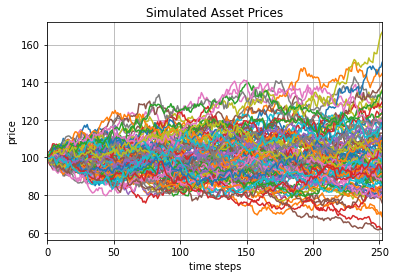

In [140]:
# Plot initial 100 simulated path using matplotlib
plt.plot(S[:,:100])
plt.grid(True)
plt.xlabel('time steps')
plt.xlim(0,252)
plt.ylabel('price')
plt.title('Simulated Asset Prices');

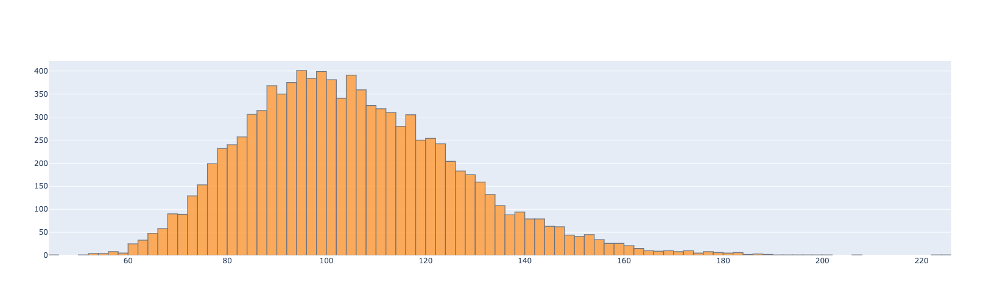

In [165]:
pd.DataFrame(S).iloc[-1].iplot(kind='histogram', title= 'Simulated Geometric Brownian Motion at Maturity', bins=100, 
    layout = {'autosize':False, 'width':700,'height':500})

<div class="alert alert-block alert-success">
<b>Success:</b> We also note that we have an informal confirmation that the exact leap formula works, as the two histograms are extremely similar.
</div>

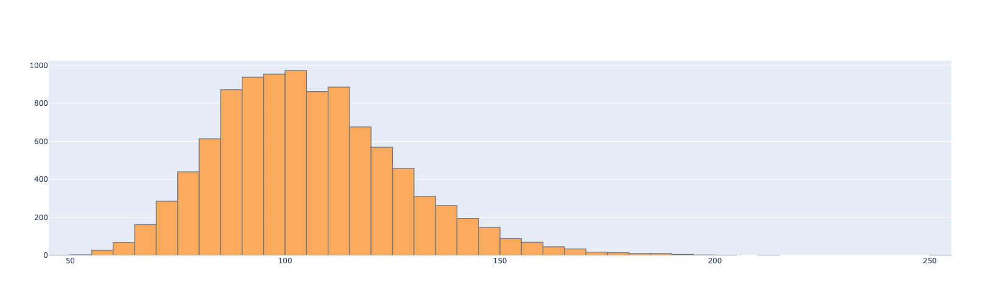

In [166]:
pd.DataFrame(S1).iplot(kind='histogram', title= 'Terminal distribution at Maturity with exact leap', bins=100,
                      layout = {'autosize':False, 'width':700,'height':500})

Now that we have seen what the data we have generated looks like, we can move on to calculating the prices of the option with the parameters initially set above.

## Results

In [70]:
print(f'Binary Call Option Value with full price paths: {C0:0.10f}')
print(f'Binary Call Option Value with terminal distribution: {C1:0.10f}')
print(f'Binary Call Option Value with Black Scholes model: {C2:0.10f}')

Binary Call Option Value with full price paths: 8.0274251134
Binary Call Option Value with terminal distribution: 8.1429994884
Binary Call Option Value with Black Scholes model: 7.9848722318


We see that the prices are very close to the Black Scholes value with 10'000 data points at the terminal distribution.  
The main parameters and results are summarised below:

In [53]:
methods = ['Full path', 'Terminal distr', 'Black Scholes']
prices = [C0,C1,C2]
errors = [abs(C0-C2), abs(C1-C2), 0]
array_count = [n*t, n, 0]

summaryFrame = pd.DataFrame({'price':prices, 'error':errors,'total array size':array_count}, index = methods)
summaryFrame

,price,error,total array size
Full path,8.0374,0.0525,2520000
Terminal distr,7.9489,-0.0359,10000
Black Scholes,7.9849,0.0000,0


# Price convergence and errors

Using a loop, we can see plot the option price converging to a stable value as we increase the number of simulations. \
The shape of the plot also reveals the speed at which the error decreases, which is ${ o(\sqrt{\frac{1}n}) }$ for n simulations.

<div class="alert alert-block alert-danger">
<b>Note:</b> Executing the below cell will take some time, depending on the computer's speed.
</div>

In [19]:
# max number of sims to get our price
# caution, nested loops
# empty array of prices
simMax = 10000
Vals = zeros(simMax)

# this is quite long because of the nested loop
for i in range(10,simMax):
    # get option value for i simulations
    S = simulate_path(So, r, s, T, t, i)
    Vals[i] = value(S,r,T,E,reb)

Text(0, 0.5, 'Option Value')

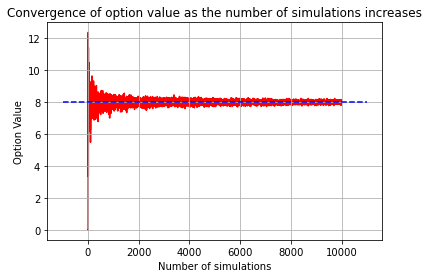

In [38]:
# plot price versus n of sims
plt.hlines(C2, -1000, simMax+1000, colors='b', linestyles='dashed',zorder = 2,label=C2) 
plt.plot(range(simMax),Vals, color='r', zorder= 1)
plt.grid(True)
plt.title('Convergence of option value as the number of simulations increases')
plt.xlabel('Number of simulations')
plt.ylabel('Option Value')

We can see here that the error decreases greatly in the beginning but gians are marginal after a certain number of simulations.  
The MCS estimated price (red line) continues to oscillate around the Black Scholes price (blue dashed line)  
Looking at the standard deviation of two different tranches of our simulated prices illustrates this:

In [46]:
s1 = std(Vals[0:50000])
s2 = std(Vals[50000:])

print(f'Stdev of price for the 5000 first sims: {s1:0.4f}')
print(f'Stdev of price after the 5000 first sims: {s2:0.4f}')

Stdev of price for the 5000 first sims: 0.4136
Stdev of price after the 5000 first sims: 0.0824


This shows that the standard deviation in the first 5000 simulations is significantly higher than for the following ones.  

## Price surfaces
Next, we plot:  
1. The value of the at the money option versus the volatility from $\sigma \in [0.05,0.8] $
2. the surface of the option value versus volatility and strike price from $ E \in [80,120] $.  

Comparing the graph of the prices obtained with Black-Scholes versus the prices obtained with MCS show how MCS finds values oscillating close to the true value.  
The rest of the parameters are as initially defined.

In [ ]:
pointcount = 250 # number of data points for our graph
volpoints = linspace(0.05,0.8,pointcount) # range for volatility
strikepoints = linspace(80,120,pointcount) # range for strike prices

# preallocate values
MCVals = zeros((pointcount,pointcount))
BSVals = zeros((pointcount,pointcount))

# generate paths
# separate this from the other cell to not recalculate on each modification
for i in range(pointcount):
    S = simulate_path(So, r, volpoints[i], T, t, n)

<div class="alert alert-block alert-danger">
<b>Note:</b> Executing the below cell will take a very long time, depending on the computer's speed. 
    <br> It is advised to comment MCVals out once calculated
</div>

In [ ]:
# generate prices
for i in range(pointcount):
    for j in range(pointcount):
        # S has been moved to another cell
        # S = simulate_path(So, r, volpoints[i], T, t, n)
        MCVals[i][j] = value(S,r,T,strikepoints[j],reb)
        BSVals[i][j] = binopt(So,strikepoints[j],r,volpoints[i],T,reb)
# pricing error
pricingerror = MCVals - BSVals

The two option price surfaces obtained fromt the calculations across the volatility range and strike price range are below:
1. Black Scholes Prices
2. MCS Prices

In [130]:
z = BSVals
x = strikepoints
y = volpoints
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout(title='Black Scholes Prices',
                  scene = dict( xaxis_title='Strike Price',
                  yaxis_title='Volatility',
                  zaxis_title='Option Value'),
                  autosize=False,
                  width=700, height=500,
                  margin=dict(l=45, r=40, b=5, t=90))
fig.show()

In [131]:
z = MCVals
x = strikepoints
y = volpoints
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout(title='MCS Prices',
                  scene = dict( xaxis_title='Strike Price',
                  yaxis_title='Volatility',
                  zaxis_title='Option Value'),
                  autosize=False,
                  width=700, height=500,
                  margin=dict(l=45, r=40, b=5, t=90))
fig.show()

Here the MCS prices surface looks like the BS surface. Upon zooming in, we see that it is rough, due to the pricing error.  
Increasing the number of simulations would result in an increased smoothness.  

## Errors
By graphing pricing errors, we see visually that the errors are stable around the tested ranges.  
We note an interesting fact, that makes sense intuitively: at low volatility and in the money (around 0.05 volatility and 80 strike price), the errors seem to decrease.  
This can be explained by the fact that randomness in the function that generates the price path is driven by volatility.  
The fact that this only happens for in the money options stems from intrinsic value and a decreasing probability of getting back out of the money.  
A similar pattern can be explored with time value, which we will not do here, for conciseness.

In [132]:
z = pricingerror
x = strikepoints
y = volpoints
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout(title='Pricing errors',
                  scene = dict( xaxis_title='Strike Price',
                  yaxis_title='Volatility',
                  zaxis_title='Pricing error'),
                  autosize=False,
                  width=700, height=500,
                  margin=dict(l=45, r=40, b=5, t=90))
fig.show()

# Conclusion
This notebook, covers the theory behind pricing a european binary option with two methods: Analytical, and Monte Carlo Simulation.  
The Euler-Maruyama method enables us to discretise the stochastic process given by a certain PDE. This in turn unlocks the search for solutions through numerical methods.  
We saw that Monte Carlo Simulation can be greatly accelerated when we know that only the final distribution of the underlying price is required to price the option.  
This is important, as increasing the number of simulations to reduce pricing error offers diminishing returns. Minimising computing time to increase the number of simulations is therefore a key topic.  
With the two price surfaces, we see the difference in behaviour between a MCS computed price and an analytically calculated price, and the 'fuzzyness' around the MCS price.  
The price surfaces and the error surface show us that the pricing error is overall stable, which is a positive signal for the real world usability of MCS. 

# References

'Binary option' (2021) Wikipedia. Available at: https://en.wikipedia.org/wiki/Binary_option (Accessed: 26 April 2021)  
'Euler–Maruyama method' (2021) Wikipedia. Available at: https://en.wikipedia.org/wiki/Euler%E2%80%93Maruyama_method (Accessed: 26 April 2021)  
Plotly.com. 2021. *3D Surface Plots*. [online] Available at: <https://plotly.com/python/3d-surface-plots/> [Accessed 26 April 2021].  
Satopay, H., 2021. The Ultimate Markdown Guide (for Jupyter Notebook). [online] Medium. Available at: <https://medium.com/analytics-vidhya/the-ultimate-markdown-guide-for-jupyter-notebook-d5e5abf728fd> (Accessed 26 April 2021).  
Wilmott, P., 2007. *Paul Wilmott Introduces Quantitative Finance*. 2nd ed. John Wiley & Sons.